# College Message Network Analysis

This notebook performs a comprehensive analysis of the UC Irvine college message network dataset. We will explore the data, build a network graph, analyze its structure and key nodes, detect communities, and visualize the findings using interactive Plotly charts.

## Import Libraries
Import necessary libraries: pandas, networkx, plotly, datetime, collections, numpy, math.

In [9]:
import pandas as pd
import networkx as nx
import plotly.graph_objects as go
from datetime import datetime
from collections import defaultdict
import numpy as np
import math
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize # Keep for potential colormap generation if needed
from matplotlib.cm import ScalarMappable # Keep for potential colormap generation if needed
import plotly.express as px # For easier colormap handling with Plotly
import seaborn as sns # For easier colormap handling with Seaborn

## Load and Prepare Data
Load the dataset from 'CollegeMsg.txt' into a pandas DataFrame. Convert UNIX timestamps to datetime objects. Display the first few rows and basic info.

In [10]:
# Define file path
file_path = "13_collegemsg_network/CollegeMsg.txt"

# Load the dataset
df = pd.read_csv(file_path, sep=' ', header=None, names=['SRC', 'TGT', 'UNIXTS'])

# Convert UNIX timestamp to datetime
df['datetime'] = pd.to_datetime(df['UNIXTS'], unit='s')

# Display first few rows
print("First 5 rows of the dataset:")
print(df.head())

# Display basic info
print("\nDataset Info:")
df.info()

# Display basic statistics of timestamps
print("\nTimestamp Range:")
print(f"From: {df['datetime'].min()} To: {df['datetime'].max()}")

First 5 rows of the dataset:
   SRC  TGT      UNIXTS            datetime
0    1    2  1082040961 2004-04-15 14:56:01
1    3    4  1082155839 2004-04-16 22:50:39
2    5    2  1082414391 2004-04-19 22:39:51
3    6    7  1082439619 2004-04-20 05:40:19
4    8    7  1082439756 2004-04-20 05:42:36

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59835 entries, 0 to 59834
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   SRC       59835 non-null  int64         
 1   TGT       59835 non-null  int64         
 2   UNIXTS    59835 non-null  int64         
 3   datetime  59835 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(3)
memory usage: 1.8 MB

Timestamp Range:
From: 2004-04-15 14:56:01 To: 2004-10-26 07:52:22


## Exploratory Data Analysis (Messages Over Time)
Calculate and print basic statistics (number of messages, unique users, time range). Aggregate messages per day and visualize the trend using a Plotly line chart.

In [11]:
# Basic statistics
num_messages = len(df)
unique_users = len(set(df['SRC']).union(set(df['TGT'])))
time_min = df['datetime'].min()
time_max = df['datetime'].max()

print(f"Number of messages: {num_messages}")
print(f"Number of unique users: {unique_users}")
print(f"Time range: {time_min} to {time_max}")

# Aggregate messages by date
df['date'] = df['datetime'].dt.date
messages_per_day = df.groupby('date').size().reset_index(name='count')

# Create an interactive line chart with Plotly
fig_time = go.Figure()
fig_time.add_trace(go.Scatter(
    x=messages_per_day['date'],
    y=messages_per_day['count'],
    mode='lines+markers',
    name='Messages per Day'
))
fig_time.update_layout(
    title='Number of Messages per Day',
    xaxis_title='Date',
    yaxis_title='Number of Messages',
    hovermode='x unified'
)
fig_time.show()

Number of messages: 59835
Number of unique users: 1899
Time range: 2004-04-15 14:56:01 to 2004-10-26 07:52:22


## Build the Network Graph
Create a directed graph using NetworkX from the pandas DataFrame, aggregating edge weights by message count. Add all unique users as nodes. Print basic graph statistics (nodes, edges, density).

In [12]:
# Aggregate messages by source (SRC) and target (TGT) to get edge weights
edge_counts = df.groupby(['SRC', 'TGT']).size().reset_index(name='weight')

# Create a directed graph
G = nx.DiGraph()

# Add edges with weights
for index, row in edge_counts.iterrows():
    G.add_edge(row['SRC'], row['TGT'], weight=row['weight'])

# Add all unique users as nodes (ensures isolated users are included)
all_users = set(df['SRC']).union(set(df['TGT']))
G.add_nodes_from(all_users)

# Basic graph statistics
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
density = nx.density(G)

print(f"Number of nodes: {num_nodes}")
print(f"Number of edges: {num_edges}")
print(f"Graph Density: {density:.6f}")

Number of nodes: 1899
Number of edges: 20296
Graph Density: 0.005631


## Analyze Network Structure
Calculate and print network density. Determine the number of weakly and strongly connected components. Calculate the average clustering coefficient.

In [13]:
# Density (already calculated, just printing again for clarity in this section)
print(f"Graph Density: {density:.6f}")

# Connected Components
num_weakly_connected = nx.number_weakly_connected_components(G)
print(f"Number of weakly connected components: {num_weakly_connected}")

num_strongly_connected = nx.number_strongly_connected_components(G)
print(f"Number of strongly connected components: {num_strongly_connected}")

# Average Clustering Coefficient
# Note: Clustering coefficient is typically defined for undirected graphs.
# NetworkX calculates it based on the definition for directed graphs.
avg_clustering = nx.average_clustering(G, weight='weight')
print(f"Average Clustering Coefficient (weighted): {avg_clustering:.6f}")

avg_clustering_unweighted = nx.average_clustering(G)
print(f"Average Clustering Coefficient (unweighted): {avg_clustering_unweighted:.6f}")

Graph Density: 0.005631
Number of weakly connected components: 4
Number of strongly connected components: 601
Average Clustering Coefficient (weighted): 0.001849
Average Clustering Coefficient (unweighted): 0.087239


## Analyze Node Importance (Degree and Centrality)
Calculate in-degree and out-degree for all nodes. Plot the degree distribution using a Plotly histogram. Identify and print the top users by in-degree and out-degree. Calculate and print the top users based on PageRank, Eigenvector Centrality, and Betweenness Centrality (using inverted weights for Betweenness).

In [14]:
# Calculate degrees
in_degrees = dict(G.in_degree())
out_degrees = dict(G.out_degree())
in_degrees_weighted = dict(G.in_degree(weight='weight'))
out_degrees_weighted = dict(G.out_degree(weight='weight'))


# Plot interactive degree histogram
fig_deg = go.Figure()
fig_deg.add_trace(go.Histogram(x=list(in_degrees.values()), name='In-degree (Count)', nbinsx=50, opacity=0.75))
fig_deg.add_trace(go.Histogram(x=list(out_degrees.values()), name='Out-degree (Count)', nbinsx=50, opacity=0.75))
# Overlay both histograms
fig_deg.update_layout(
    title='Node Degree Distribution (Unweighted)',
    xaxis_title='Degree',
    yaxis_title='Frequency',
    barmode='overlay'
)
fig_deg.show()

# Top users by degree
top_n = 10
top_in_degree = sorted(in_degrees.items(), key=lambda item: item[1], reverse=True)[:top_n]
top_out_degree = sorted(out_degrees.items(), key=lambda item: item[1], reverse=True)[:top_n]
top_in_degree_weighted = sorted(in_degrees_weighted.items(), key=lambda item: item[1], reverse=True)[:top_n]
top_out_degree_weighted = sorted(out_degrees_weighted.items(), key=lambda item: item[1], reverse=True)[:top_n]


print(f"\nTop {top_n} Users by In-Degree (Received Connections):")
print(pd.DataFrame(top_in_degree, columns=['User ID', 'In-Degree']))

print(f"\nTop {top_n} Users by Out-Degree (Sent Connections):")
print(pd.DataFrame(top_out_degree, columns=['User ID', 'Out-Degree']))

print(f"\nTop {top_n} Users by Weighted In-Degree (Received Messages):")
print(pd.DataFrame(top_in_degree_weighted, columns=['User ID', 'Weighted In-Degree']))

print(f"\nTop {top_n} Users by Weighted Out-Degree (Sent Messages):")
print(pd.DataFrame(top_out_degree_weighted, columns=['User ID', 'Weighted Out-Degree']))


# Centrality Measures
print("\nCalculating Centrality Measures...")

# PageRank (uses weighted edges)
pagerank = nx.pagerank(G, weight='weight')
top_pagerank = sorted(pagerank.items(), key=lambda item: item[1], reverse=True)[:top_n]
print(f"\nTop {top_n} Users by PageRank:")
print(pd.DataFrame(top_pagerank, columns=['User ID', 'PageRank Score']))

# Eigenvector Centrality (uses weighted edges)
# May fail on graphs that are not strongly connected. Use max_iter and tol for convergence.
try:
    eigenvector_cen = nx.eigenvector_centrality(G, weight='weight', max_iter=1000, tol=1e-06)
    top_eigenvector = sorted(eigenvector_cen.items(), key=lambda item: item[1], reverse=True)[:top_n]
    print(f"\nTop {top_n} Users by Eigenvector Centrality:")
    print(pd.DataFrame(top_eigenvector, columns=['User ID', 'Eigenvector Centrality']))
except nx.PowerIterationFailedConvergence:
    print("\nEigenvector Centrality did not converge.")


# Betweenness Centrality (use inverted weights for shortest paths)
# Create a copy with inverted weights (higher message count = shorter distance)
G_inverted = G.copy()
for u, v, data in G.edges(data=True):
    # Add a small epsilon to avoid division by zero if weight is 0 (though unlikely with counts)
    G_inverted[u][v]['inv_weight'] = 1.0 / (data['weight'] + 1e-9)

# Calculate Betweenness Centrality using the inverted weight
# Note: This can be computationally expensive for large graphs.
# Consider using k for approximation: nx.betweenness_centrality(G_inverted, k=100, weight='inv_weight')
print("\nCalculating Betweenness Centrality (this may take a while)...")
betweenness_cen = nx.betweenness_centrality(G_inverted, weight='inv_weight', normalized=True)
top_betweenness = sorted(betweenness_cen.items(), key=lambda item: item[1], reverse=True)[:top_n]
print(f"\nTop {top_n} Users by Betweenness Centrality:")
print(pd.DataFrame(top_betweenness, columns=['User ID', 'Betweenness Centrality']))


Top 10 Users by In-Degree (Received Connections):
   User ID  In-Degree
0       32        137
1       42        120
2      638        119
3      372        115
4      598        115
5      103        106
6      194         97
7      249         97
8     1283         96
9      713         95

Top 10 Users by Out-Degree (Sent Connections):
   User ID  Out-Degree
0        9         237
1      103         233
2      105         219
3      400         217
4       32         182
5       41         178
6        3         175
7      249         168
8       42         160
9      713         148

Top 10 Users by Weighted In-Degree (Received Messages):
   User ID  Weighted In-Degree
0     1624                 558
1      323                 534
2       32                 501
3      103                 440
4      372                 428
5      454                 377
6      475                 372
7      254                 351
8      617                 351
9      105                 345

Top 10 

--- Top 10 Users by Different Centrality Measures ---

Top 10 by in_degree:
32      137
42      120
638     119
372     115
598     115
103     106
194      97
249      97
1283     96
713      95
Name: in_degree, dtype: int64

Top 10 by out_degree:
9      237
103    233
105    219
400    217
32     182
41     178
3      175
249    168
42     160
713    148
Name: out_degree, dtype: int64

Top 10 by page_rank:
32      0.006861
323     0.006834
372     0.006090
103     0.005746
1624    0.005546
325     0.004971
42      0.004940
542     0.004936
72      0.004744
454     0.004615
Name: page_rank, dtype: float64

Top 10 by eigenvector:
1624    0.469128
398     0.300367
105     0.266687
1168    0.251122
323     0.198439
557     0.156583
281     0.135806
569     0.114544
341     0.113772
68      0.109673
Name: eigenvector, dtype: float64

Top 10 by betweenness:
323     0.118962
1624    0.081706
105     0.076115
605     0.066177
103     0.065360
679     0.057052
32      0.052606
398     0.05006

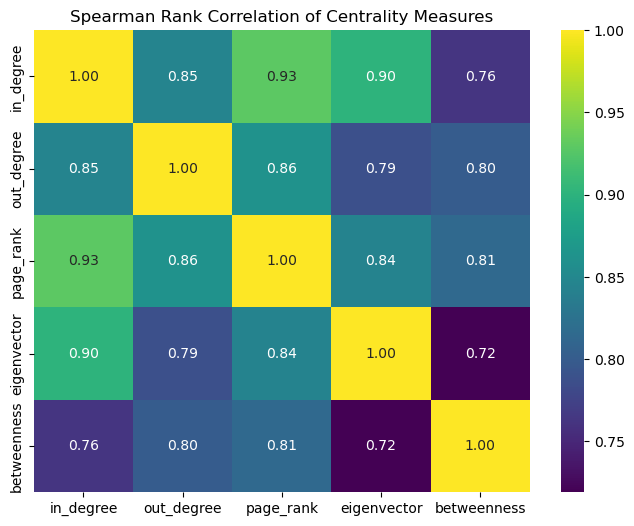

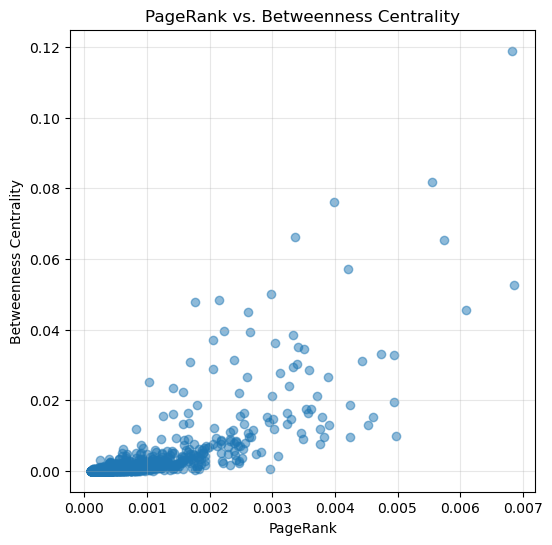

In [15]:
# --- Centrality Comparison ---
# Assuming your centralities are stored in dictionaries like:
# in_degrees, out_degrees, pagerank,
# eigenvector_cen, betweenness_cen

# Consolidate centralities into a DataFrame
centrality_df = pd.DataFrame({
    'in_degree': pd.Series(in_degrees),         # Corrected: Use in_degrees
    'out_degree': pd.Series(out_degrees),        # Corrected: Use out_degrees
    'page_rank': pd.Series(pagerank),
    'eigenvector': pd.Series(eigenvector_cen),   # Corrected: Use eigenvector_cen
    'betweenness': pd.Series(betweenness_cen)    # Corrected: Use betweenness_cen
})

# Fill NaN for nodes that might be missing in some calculations (e.g., isolates for betweenness, or if eigenvector failed)
centrality_df.fillna(0, inplace=True)

print("--- Top 10 Users by Different Centrality Measures ---")

n_top = 10
for col in centrality_df.columns:
    # Check if the column exists and has data before trying to get nlargest
    if col in centrality_df and not centrality_df[col].empty:
        try:
            top_nodes = centrality_df[col].nlargest(n_top)
            print(f"\nTop {n_top} by {col}:")
            print(top_nodes)
        except Exception as e:
            print(f"\nCould not calculate top {n_top} for {col}: {e}")
    else:
        print(f"\nCentrality measure '{col}' not available or empty.")


print("\n--- Correlation Between Centrality Measures (Spearman Rank) ---")
# Spearman is often preferred for comparing rankings, less sensitive to outliers
# Only calculate correlation if the DataFrame is not empty and has numeric columns
if not centrality_df.empty and centrality_df.select_dtypes(include=np.number).shape[1] > 1:
    centrality_corr = centrality_df.corr(method='spearman')
    print(centrality_corr)


    plt.figure(figsize=(8, 6))
    sns.heatmap(centrality_corr, annot=True, cmap='viridis', fmt=".2f")
    plt.title('Spearman Rank Correlation of Centrality Measures')
    plt.show()

    # Optional: Scatter plot of two specific centralities (e.g., PageRank vs. Betweenness)
    # Check if both columns exist before plotting
    if 'page_rank' in centrality_df and 'betweenness' in centrality_df:
        plt.figure(figsize=(6, 6))
        plt.scatter(centrality_df['page_rank'], centrality_df['betweenness'], alpha=0.5)
        plt.title('PageRank vs. Betweenness Centrality')
        plt.xlabel('PageRank')
        plt.ylabel('Betweenness Centrality')
        # Consider log scale if values are skewed:
        # plt.xscale('log')
        # plt.yscale('log')
        plt.grid(True, alpha=0.3)
        plt.show()
    else:
        print("\nSkipping PageRank vs. Betweenness scatter plot as one or both columns are missing.")
else:
    print("\nSkipping correlation calculation and visualization as centrality data is insufficient.")


Network Reciprocity: 0.6364

Pearson Correlation between In-Degree and Out-Degree: 0.8311


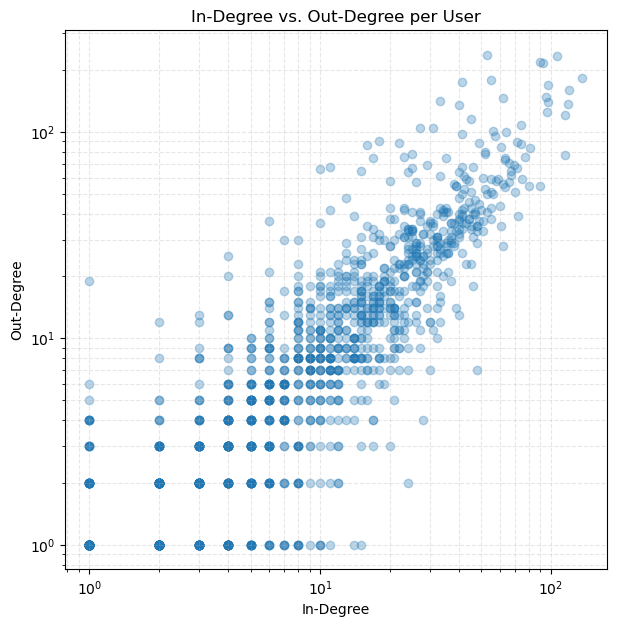

In [23]:
# --- Reciprocity ---
# Measures the tendency for edges to be mutual (A->B and B->A)

reciprocity_val = nx.reciprocity(G)
print(f"Network Reciprocity: {reciprocity_val:.4f}")

# Interpretation: Value ranges from 0 (no mutual edges) to 1 (all edges are part of a mutual pair).
# Compares the number of mutual edges to the total number of edges in the graph.


# --- In-Degree vs. Out-Degree Correlation ---
# Do users who send many messages also receive many?

# Ensure centrality_df exists from the previous snippet, or calculate degrees separately

degree_comp_df = centrality_df[['in_degree', 'out_degree']].copy() # Use scaled centrality if preferred, or recalculate raw degrees

# Calculate Pearson correlation coefficient
degree_corr = degree_comp_df['in_degree'].corr(degree_comp_df['out_degree'])
print(f"\nPearson Correlation between In-Degree and Out-Degree: {degree_corr:.4f}")

# Visualize the relationship
plt.figure(figsize=(7, 7))
plt.scatter(degree_comp_df['in_degree'], degree_comp_df['out_degree'], alpha=0.3)
plt.title('In-Degree vs. Out-Degree per User')
plt.xlabel('In-Degree')
plt.ylabel('Out-Degree')

# Often useful to plot on log-log scale due to skewed distributions
# Add 1 to avoid log(0) issues if degrees can be zero
plt.xscale('log')
plt.yscale('log')
plt.grid(True, which="both", ls="--", alpha=0.3)
plt.show()

In [34]:
nx.degree_assortativity_coefficient(G)

-0.13745750567481108

In [25]:
# --- Average Clustering Coefficient ---
# Measures the average local density or cliquishness around nodes

# For the directed graph (measures cycles of length 3)
avg_clustering_directed = nx.average_clustering(G)
print(f"Average Clustering Coefficient (Directed): {avg_clustering_directed:.4f}")


# Interpretation: Higher values indicate more tightly knit local structures.
# Compare this to the density of the graph. Often, real-world networks
# have high clustering despite being globally sparse (low density).
# Also consider comparing to a random graph model if desired.

Average Clustering Coefficient (Directed): 0.0872


## Detect Network Communities
Use the Louvain algorithm to detect communities in the graph based on edge weights. Print the number of communities found and the overall modularity score.

In [16]:
# Detect communities using the Louvain algorithm
# Note: Louvain is primarily for undirected graphs, but networkx provides an implementation
# that works on directed graphs by considering edge weights.
print("\nDetecting communities using Louvain algorithm...")
# The function returns a list of sets, where each set contains the nodes in a community.
communities = nx.community.louvain_communities(G, weight='weight', seed=42)
num_communities = len(communities)
print(f"Number of communities found: {num_communities}")

# Calculate modularity
modularity_score = nx.community.modularity(G, communities, weight='weight')
print(f"Modularity score of the partition: {modularity_score:.6f}")

# Create a mapping from node to community ID for easier use later
node_community_mapping = {}
for i, comm in enumerate(communities):
    for node in comm:
        node_community_mapping[node] = i


Detecting communities using Louvain algorithm...
Number of communities found: 16
Modularity score of the partition: 0.360747


## Visualize the Full Network
Generate node positions using a spring layout. Create Plotly traces for edges and nodes. Display the full network interactively using Plotly, allowing zoom and hover. Node size can represent degree, and color can represent community.

In [17]:
print("\nGenerating full network visualization (may take time for layout)...")

# Generate node positions using a spring layout (can be slow for large graphs)
# Consider using other layouts like Kamada-Kawai (nx.kamada_kawai_layout) or pre-computing positions.
pos = nx.spring_layout(G, seed=42, k=0.15) # Adjust k for spacing

# Prepare edge data for Plotly
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None]) # None separates lines
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Prepare node data for Plotly
node_x = []
node_y = []
node_text = []
node_color = []
node_size = []

# Use a continuous color scale for PageRank and discrete colors for communities
# Here, let's color by community and size by weighted in-degree
max_in_degree_w = max(in_degrees_weighted.values()) if in_degrees_weighted else 1
min_node_size = 5
max_node_size = 30

# Generate discrete colors for communities
colors = px.colors.qualitative.Plotly # Get a qualitative color scale

for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

    # Node size based on weighted in-degree (log scale might be better if distribution is skewed)
    degree_w = in_degrees_weighted.get(node, 0)
    size = min_node_size + (max_node_size - min_node_size) * (degree_w / max_in_degree_w)
    node_size.append(size)

    # Node color based on community
    community_id = node_community_mapping.get(node, -1) # -1 for nodes not in any community (if any)
    node_color.append(colors[community_id % len(colors)]) # Cycle through colors if more communities than colors

    # Hover text
    text = f"User ID: {node}<br>"
    text += f"Community: {community_id}<br>"
    text += f"In-Degree (W): {degree_w}<br>"
    text += f"Out-Degree (W): {out_degrees_weighted.get(node, 0)}<br>"
    text += f"PageRank: {pagerank.get(node, 0):.4f}"
    node_text.append(text)


node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=node_text,
    marker=dict(
        showscale=False, # No continuous scale needed for community colors
        color=node_color,
        size=node_size,
        line_width=0.5,
        line_color='black'
        )
    )

# Create the figure
fig_full = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title=dict( # Modified line
                    text='Full Interactive Network Visualization (Colored by Community, Sized by Weighted In-Degree)', # Moved title text here
                    font=dict(size=16) # Set font size within title dict
                ),
                # titlefont_size=16, # Removed incorrect line
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text="Network analysis using NetworkX and Plotly",
                    showarrow=False,
                    xref="paper", yref="paper",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

print("Displaying full network plot...")
fig_full.show()


Generating full network visualization (may take time for layout)...
Displaying full network plot...


In [18]:
# Add this cell after the existing full network visualization (cell id: 8cfee31a)

print("\\nGenerating alternative full network visualization (Sized/Colored by In-Degree)...")

# Reuse the layout calculated earlier
# pos = nx.spring_layout(G, seed=42, k=0.15) # Already calculated

# Edges are the same as the previous plot
# edge_trace = go.Scatter(...) # Already defined essentially

# Prepare node data for Plotly (alternative version)
node_x_alt = []
node_y_alt = []
node_text_alt = []
node_color_alt = [] # Color based on in-degree
node_size_alt = []  # Size based on in-degree

max_in_degree = max(in_degrees.values()) if in_degrees else 1
min_node_size_alt = 4
max_node_size_alt = 25

for node in G.nodes():
    x, y = pos[node]
    node_x_alt.append(x)
    node_y_alt.append(y)

    # Node size and color based on unweighted in-degree
    degree = in_degrees.get(node, 0)
    size = min_node_size_alt + (max_node_size_alt - min_node_size_alt) * (degree / max_in_degree)
    node_size_alt.append(size)
    node_color_alt.append(degree) # Use degree value for color scale

    # Hover text
    text = f"User ID: {node}<br>"
    text += f"In-Degree: {degree}<br>"
    text += f"Out-Degree: {out_degrees.get(node, 0)}"
    node_text_alt.append(text)


node_trace_alt = go.Scatter(
    x=node_x_alt, y=node_y_alt,
    mode='markers',
    hoverinfo='text',
    text=node_text_alt,
    marker=dict(
        showscale=True, # Show color scale
        colorscale='YlGnBu', # Color scale
        color=node_color_alt,
        size=node_size_alt,
        colorbar=dict(
            thickness=15,
            title=dict( # Modified line: title is now a dict
                text='Node In-Degree', # Moved text here
                side='right' # Correct property name is 'side'
            ),
            xanchor='left',
            # titleside='right' # Removed invalid property from here
        ),
        line_width=0.5,
        line_color='black'
        )
    )

# Create the alternative figure
fig_full_alt = go.Figure(data=[edge_trace, node_trace_alt], # Reuse edge_trace
             layout=go.Layout(
                title=dict(
                    text='Full Interactive Network Visualization (Colored/Sized by In-Degree)',
                    font=dict(size=16)
                ),
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text="Alternative network visualization",
                    showarrow=False,
                    xref="paper", yref="paper",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

print("Displaying alternative full network plot...")
fig_full_alt.show()

\nGenerating alternative full network visualization (Sized/Colored by In-Degree)...
Displaying alternative full network plot...


In [29]:
# --- Calculate Proportion of Nodes in Largest Components ---

# Ensure the graph G exists and has nodes
if G.number_of_nodes() > 0:
    total_nodes = G.number_of_nodes()
    print(f"Total nodes in the graph: {total_nodes}")

    # --- Largest Weakly Connected Component (LWCC) ---
    # nx.weakly_connected_components returns a generator sorted by size, largest first
    try:
        lwcc_nodes = next(nx.weakly_connected_components(G))
        num_nodes_lwcc = len(lwcc_nodes)
        proportion_lwcc = num_nodes_lwcc / total_nodes
        print(f"\nLargest Weakly Connected Component (LWCC):")
        print(f"  - Number of nodes: {num_nodes_lwcc}")
        print(f"  - Proportion of total nodes: {proportion_lwcc:.4f} ({proportion_lwcc * 100:.2f}%)")
    except StopIteration:
        # This happens if the graph has nodes but no edges, or is empty (handled above)
        print("\nNo weakly connected components found (or graph is empty).")
        proportion_lwcc = 0.0


    # --- Largest Strongly Connected Component (LSCC) ---
    # nx.strongly_connected_components also returns a generator sorted by size, largest first
    try:
        lscc_nodes = next(nx.strongly_connected_components(G))
        num_nodes_lscc = len(lscc_nodes)
        proportion_lscc = num_nodes_lscc / total_nodes
        print(f"\nLargest Strongly Connected Component (LSCC):")
        print(f"  - Number of nodes: {num_nodes_lscc}")
        print(f"  - Proportion of total nodes: {proportion_lscc:.4f} ({proportion_lscc * 100:.2f}%)")
    except StopIteration:
        print("\nNo strongly connected components found (or graph is empty).")
        proportion_lscc = 0.0

else:
    print("Graph has no nodes. Cannot calculate component proportions.")
    proportion_lwcc = 0.0
    proportion_lscc = 0.0


Total nodes in the graph: 1899

Largest Weakly Connected Component (LWCC):
  - Number of nodes: 1893
  - Proportion of total nodes: 0.9968 (99.68%)

Largest Strongly Connected Component (LSCC):
  - Number of nodes: 1
  - Proportion of total nodes: 0.0005 (0.05%)


In [31]:
# --- Existing code in cell f8be30a8 ---
# Density (already calculated, just printing again for clarity in this section)
print(f"Graph Density: {nx.density(G):.6f}")

# Connected Components
num_weakly_connected = nx.number_weakly_connected_components(G)
print(f"\nNumber of weakly connected components: {num_weakly_connected}")

# --- New code for weakly connected component sizes ---
print("Sizes of Weakly Connected Components:")
weak_component_sizes = [len(c) for c in sorted(nx.weakly_connected_components(G), key=len, reverse=True)]
# Print summary if there are many components
if len(weak_component_sizes) > 20:
    print(f"  Largest 10: {weak_component_sizes[:10]}")
    print(f"  Smallest 10: {weak_component_sizes[-10:]}")
    print(f"  (Total: {len(weak_component_sizes)} components)")
else:
    print(f"  Sizes: {weak_component_sizes}")
# --- End of new code ---

num_strongly_connected = nx.number_strongly_connected_components(G)
print(f"\nNumber of strongly connected components: {num_strongly_connected}")

# --- New code for strongly connected component sizes ---
print("Sizes of Strongly Connected Components:")
strong_component_sizes = [len(c) for c in sorted(nx.strongly_connected_components(G), key=len, reverse=True)]
# Print summary if there are many components
if len(strong_component_sizes) > 20:
    print(f"  Largest 10: {strong_component_sizes[:10]}")
    print(f"  Smallest 10: {strong_component_sizes[-10:]}")
    print(f"  (Total: {len(strong_component_sizes)} components)")
else:
    print(f"  Sizes: {strong_component_sizes}")
# --- End of new code ---


# --- Existing code in cell f8be30a8 ---
# Average Clustering Coefficient
# Note: Clustering coefficient is typically defined for undirected graphs.
# NetworkX calculates it based on the definition for directed graphs.
avg_clustering = nx.average_clustering(G, weight='weight')
print(f"\nAverage Clustering Coefficient (weighted): {avg_clustering:.6f}")

avg_clustering_unweighted = nx.average_clustering(G)
print(f"Average Clustering Coefficient (unweighted): {avg_clustering_unweighted:.6f}")


Graph Density: 0.005631

Number of weakly connected components: 4
Sizes of Weakly Connected Components:
  Sizes: [1893, 2, 2, 2]

Number of strongly connected components: 601
Sizes of Strongly Connected Components:
  Largest 10: [1294, 2, 2, 2, 2, 2, 1, 1, 1, 1]
  Smallest 10: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
  (Total: 601 components)

Average Clustering Coefficient (weighted): 0.001849
Average Clustering Coefficient (unweighted): 0.087239


In [37]:
# --- Visualization of Strongly Connected Components ---

# Prerequisites (ensure these variables exist from previous cells):
# G: Your NetworkX DiGraph object (defined in c5216852)
# pos: Node layout positions (calculated in 8cfee31a or recalculate here if needed)
# in_degrees, out_degrees: Calculated in c2629ad1 (optional, depending on sizing choice)

print("Starting SCC visualization generation...")

# --- NEW: Calculate Strongly Connected Components ---
print("Calculating strongly connected components...")
# nx.strongly_connected_components returns a generator. Convert to list for sorting/reuse.
scc_generator = nx.strongly_connected_components(G)
# Sort by size (largest first)
scc_list = sorted(list(scc_generator), key=len, reverse=True)
print(f"Found {len(scc_list)} strongly connected components.")
# --- END NEW ---

# --- NEW: Define node_degrees for sizing ---
# Using total unweighted degree. Change to in_degrees or out_degrees if preferred.
print("Calculating node degrees for sizing...")
node_degrees = dict(G.degree())
print("Node degrees calculated.")
# --- END NEW ---


# 1. Calculate or Reuse layout (use a seed for reproducibility)
# Check if 'pos' exists from a previous cell (e.g., 8cfee31a), otherwise calculate it.
if 'pos' not in locals():
    print("Calculating spring layout (as 'pos' not found)...")
    try:
        # For standard spring layout:
        pos = nx.spring_layout(G, seed=42, k=0.15, iterations=50) # Adjust k and iterations if needed
        print("Layout calculated.")
    except Exception as e:
        print(f"Error during layout calculation: {e}")
        # Fallback to random layout if spring layout fails
        pos = nx.random_layout(G, seed=42)
        print("Using random layout as fallback.")
else:
    print("Reusing existing layout 'pos'.")


# 2. Categorize nodes by SCC
print("Categorizing nodes by SCC...")
node_scc_category = {}
largest_scc_nodes = set()

# --- MODIFIED: Use scc_list ---
if scc_list: # Check if scc_list is not empty
    largest_scc_nodes = scc_list[0] # Already sorted, largest is first

    for component in scc_list: # Iterate through the sorted list
        size = len(component)
        category = 'Peripheral (Size 1)' # Default assumption for SCCs of size 1

        if component == largest_scc_nodes:
            category = f'Core (Largest SCC, Size {size})'
        elif size > 1:
            # Assign a generic category for other multi-node SCCs
            category = f'Other Multi-Node SCC (Size {size})'

        for node in component:
            node_scc_category[node] = category
# --- END MODIFIED ---
else:
    print("Warning: No strongly connected components found.")
    # Assign all nodes a default category if G exists but has no SCCs (e.g., acyclic)
    for node in G.nodes():
         node_scc_category[node] = 'Undefined SCC'

print("Node categorization complete.")


# 3. Define category colors
print("Defining category colors...")
# Using a dictionary for clarity and specific assignments
category_colors_map = {
    # Use f-string safely only if largest_scc_nodes is guaranteed non-empty
    f'Core (Largest SCC, Size {len(largest_scc_nodes)})' if largest_scc_nodes else 'Core (Largest SCC)': 'rgba(227, 26, 28, 0.9)', # Strong Red
    'Peripheral (Size 1)': 'rgba(200, 200, 200, 0.7)', # Light Grey
    'Undefined SCC': 'rgba(0, 0, 0, 0.5)', # Black for undefined case
}

# Assign distinct colors to the 'Other Multi-Node SCC' categories found
other_scc_categories = sorted(list(set(cat for cat in node_scc_category.values() if cat.startswith('Other'))))
# Using a predefined palette
palette = ['rgba(31, 119, 180, 0.8)',  # Blue
           'rgba(255, 127, 14, 0.8)',   # Orange
           'rgba(44, 160, 44, 0.8)',    # Green
           'rgba(148, 103, 189, 0.8)',  # Purple
           'rgba(140, 86, 75, 0.8)']     # Brown

print(f"Found {len(other_scc_categories)} 'Other Multi-Node SCC' categories.")
for i, cat in enumerate(other_scc_categories):
     category_colors_map[cat] = palette[i % len(palette)] # Cycle through palette

print("Color mapping defined.")

# 4. Create edge trace (same as before, uses 'pos')
print("Creating edge trace...")
edge_x = []
edge_y = []
for edge in G.edges():
    # Check if both nodes exist in pos (handles potential inconsistencies)
    if edge[0] in pos and edge[1] in pos:
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
    # else:
    #     print(f"Warning: Position not found for edge {edge}. Skipping.")


edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.3, color='rgba(180, 180, 180, 0.6)'), # Lighter edges
    hoverinfo='none',
    mode='lines')
print("Edge trace created.")

# 5. Create node trace (modified for SCC coloring and sizing)
print("Creating node trace...")
node_x = []
node_y = []
node_text = []
node_color = []
node_size = []

# --- Node sizing parameters ---
min_size = 5  # Minimum marker size
max_size = 30 # Maximum marker size
sizing_mode = 'diameter' # 'diameter' or 'area'

# Calculate scaling factors robustly using the defined node_degrees
# --- MODIFIED: Use the defined node_degrees ---
degrees_present = [node_degrees.get(node, 0) for node in G.nodes() if node in node_degrees]
# --- END MODIFIED ---
if degrees_present:
    min_deg = min(degrees_present)
    max_deg = max(degrees_present)
    # Add small epsilon if min and max are the same to avoid division by zero
    if max_deg == min_deg:
         max_deg += 1e-6
else: # Handle case where node_degrees is empty or nodes are missing
    min_deg = 0
    max_deg = 1
    print("Warning: Node degrees for sizing seem missing or incomplete.")
# --- End Node sizing parameters ---


for node in G.nodes():
    # Check if node exists in pos
    if node in pos:
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)

        # --- MODIFIED: Use the defined node_degrees ---
        degree = node_degrees.get(node, 0)
        # --- END MODIFIED ---
        category = node_scc_category.get(node, 'Undefined SCC')
        node_color.append(category_colors_map.get(category, 'black')) # Use the mapped color

        # Scale node size linearly between min_size and max_size based on degree
        if max_deg > min_deg:
             size = min_size + (degree - min_deg) * (max_size - min_size) / (max_deg - min_deg)
        else:
             size = min_size

        node_size.append(max(min_size, size)) # Ensure size is at least min_size

        # Update hover text
        node_text.append(f'User: {node}<br>Degree: {degree}<br>SCC: {category}')
    # else:
    #     print(f"Warning: Position not found for node {node}. Skipping.")


# Determine sizeref based on sizing_mode
if sizing_mode == 'area':
    sizeref = 2. * max(node_size)/(max_size**2) if node_size else 1
else: # diameter
    sizeref = max(node_size)/max_size if node_size else 1

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=node_text,
    marker=dict(
        showscale=False, # No continuous colorscale needed here
        color=node_color, # Directly use the list of category-based colors
        size=node_size,
        sizemode=sizing_mode,
        sizeref=sizeref,
        sizemin=min_size,
        line_width=0.8, # Slightly thinner line
        line_color='rgba(40, 40, 40, 0.8)') # Darker marker edge
    )
print("Node trace created.")

# 6. Create figure
print("Creating figure layout...")
fig_scc = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title=dict(
                    text='Network Visualization by Strongly Connected Component Category',
                    font=dict(size=18)
                ),
                showlegend=False, # Legend might be too cluttered; rely on hover text and title/annotation
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text="Nodes colored by SCC category (Red=Core, Grey=Peripheral, Others=Multi-Node).",
                    showarrow=False,
                    xref="paper", yref="paper",
                    x=0.005, y=-0.002, # Position annotation at bottom left
                    font=dict(size=10) )],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False, range=[-1.1, 1.1]), # Fixed range can help stability
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False, range=[-1.1, 1.1]),
                plot_bgcolor='rgba(250, 250, 250, 1)' # Light background
             ))

print("Figure created. Showing plot...")
# Display the plot
fig_scc.show()

# Optional: Save the figure to a file
# print("Saving figure...")
# fig_scc.write_image("scc_visualization.png", width=1000, height=800, scale=2)
# fig_scc.write_html("scc_visualization.html")
# print("Figure saved.")

Starting SCC visualization generation...
Calculating strongly connected components...
Found 601 strongly connected components.
Calculating node degrees for sizing...
Node degrees calculated.
Reusing existing layout 'pos'.
Categorizing nodes by SCC...
Node categorization complete.
Defining category colors...
Found 1 'Other Multi-Node SCC' categories.
Color mapping defined.
Creating edge trace...
Edge trace created.
Creating node trace...
Node trace created.
Creating figure layout...
Figure created. Showing plot...


## Visualize Subgraph of Central Nodes
Create a subgraph containing nodes with an in-degree above a defined threshold (e.g., 10). Generate positions for the subgraph. Create Plotly traces, sizing nodes based on their in-degree. Display the interactive subgraph.

In [19]:
# Define threshold for central nodes (e.g., based on unweighted in-degree)
degree_threshold = 10
central_nodes = [node for node, deg in in_degrees.items() if deg >= degree_threshold]

# Create subgraph
sub_G = G.subgraph(central_nodes)
print(f"\nCreating subgraph with {sub_G.number_of_nodes()} nodes (In-Degree >= {degree_threshold})...")

# Generate layout for the subgraph
pos_sub = nx.spring_layout(sub_G, seed=42, k=0.3) # Adjust k for subgraph spacing

# Prepare edge data for Plotly subgraph
edge_x_sub = []
edge_y_sub = []
for edge in sub_G.edges():
    x0, y0 = pos_sub[edge[0]]
    x1, y1 = pos_sub[edge[1]]
    edge_x_sub.extend([x0, x1, None])
    edge_y_sub.extend([y0, y1, None])

edge_trace_sub = go.Scatter(
    x=edge_x_sub, y=edge_y_sub,
    line=dict(width=0.7, color='#aaa'), # Slightly thicker edges for subgraph
    hoverinfo='none',
    mode='lines')

# Prepare node data for Plotly subgraph
node_x_sub = []
node_y_sub = []
node_text_sub = []
node_color_sub = []
node_size_sub = []

# Use weighted in-degree for size and community for color again
sub_in_degrees_w = {node: in_degrees_weighted.get(node, 0) for node in sub_G.nodes()}
max_sub_in_degree_w = max(sub_in_degrees_w.values()) if sub_in_degrees_w else 1

for node in sub_G.nodes():
    x, y = pos_sub[node]
    node_x_sub.append(x)
    node_y_sub.append(y)

    # Node size
    degree_w = sub_in_degrees_w.get(node, 0)
    size = min_node_size + (max_node_size - min_node_size) * (degree_w / max_sub_in_degree_w)
    node_size_sub.append(size)

    # Node color
    community_id = node_community_mapping.get(node, -1)
    node_color_sub.append(colors[community_id % len(colors)])

    # Hover text
    text = f"User ID: {node}<br>"
    text += f"Community: {community_id}<br>"
    text += f"In-Degree (W): {degree_w}<br>"
    text += f"Out-Degree (W): {out_degrees_weighted.get(node, 0)}<br>"
    text += f"PageRank: {pagerank.get(node, 0):.4f}"
    node_text_sub.append(text)

node_trace_sub = go.Scatter(
    x=node_x_sub, y=node_y_sub,
    mode='markers',
    hoverinfo='text',
    text=node_text_sub,
    marker=dict(
        showscale=False,
        color=node_color_sub,
        size=node_size_sub,
        line_width=0.5,
        line_color='black'
        )
    )

# Create the subgraph figure
fig_sub = go.Figure(data=[edge_trace_sub, node_trace_sub],
             layout=go.Layout(
                title=dict( # Modified line
                    text=f'Interactive Subgraph (Nodes with In-Degree >= {degree_threshold})', # Moved title text here
                    font=dict(size=16) # Set font size within title dict
                ),
                # titlefont_size=16, # Removed incorrect line
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

print("Displaying subgraph plot...")
fig_sub.show()


Creating subgraph with 627 nodes (In-Degree >= 10)...
Displaying subgraph plot...


## Visualize Network Communities
This section is integrated into the Full Network and Subgraph visualizations above, where nodes are colored based on their detected community membership. The hover text also includes the community ID. No separate plot is generated here, but the previous plots already fulfill this requirement.

In [20]:
# Calculate global values needed for consistent scaling in community plots
all_weights = [d['weight'] for u, v, d in G.edges(data=True)]
global_max_weight = max(all_weights) if all_weights else 1
# global_degrees = dict(G.degree(weight='weight')) # Use weighted degrees calculated earlier (in_degrees_weighted + out_degrees_weighted?)
# Let's recalculate total weighted degree for consistency with source.ipynb
global_degrees = {node: G.degree(node, weight='weight') for node in G.nodes()}
global_max_degree = max(global_degrees.values()) if global_degrees else 1


\nGenerating separate community visualizations (Matplotlib)...


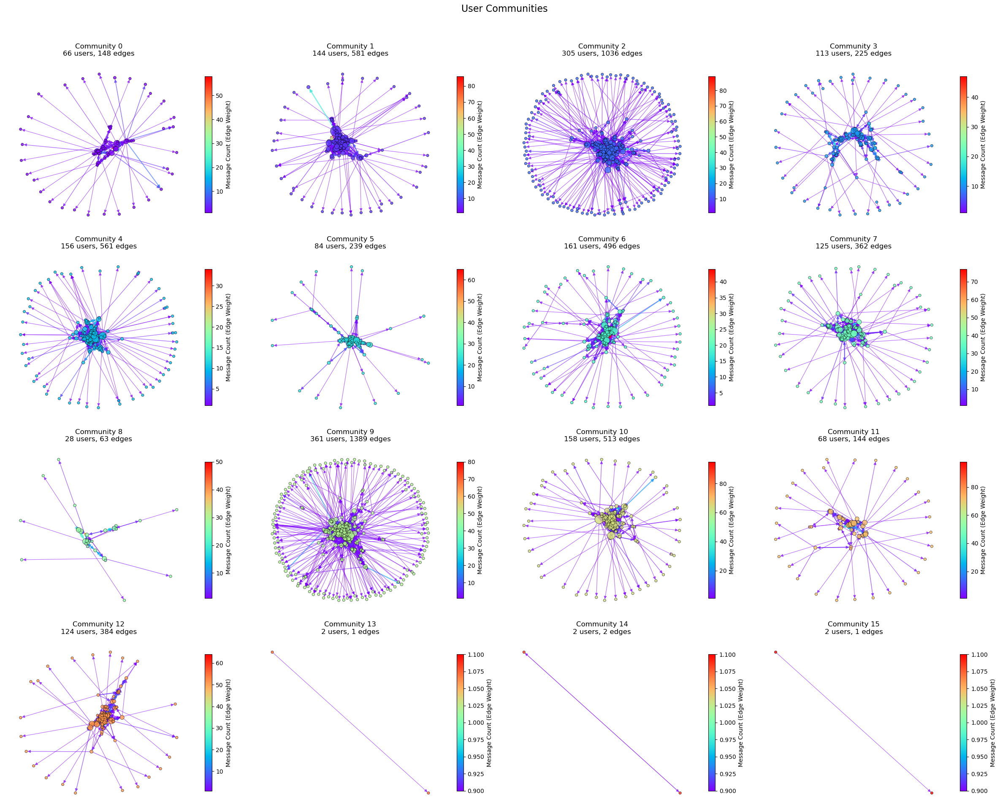

Finished generating separate community visualizations.


In [35]:
# Add this cell, e.g., after the section "Visualize Network Communities"

print("\\nGenerating separate community visualizations (Matplotlib)...")

# -------- plotting communities --------

num_communities_viz = len(communities)
cols = math.ceil(math.sqrt(num_communities_viz))
rows = math.ceil(num_communities_viz / cols)

fig_comm, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 5))
if num_communities_viz == 1: # Handle single community case
    axes = np.array([axes])
axes = axes.flatten()

# colors
cmap = plt.cm.rainbow # Using rainbow colormap as in source.ipynb
community_colors = cmap(np.linspace(0, 1, num_communities_viz))

for i, comm_nodes in enumerate(communities):
    if i >= len(axes): break # Avoid index error if calculation is slightly off
    ax = axes[i]
    comm_set = set(comm_nodes)

    # a subgraph for each community
    subgraph = G.subgraph(comm_nodes).copy()

    if subgraph.number_of_nodes() > 0:
        # Layout calculation (adjust k as needed)
        k_val = 0.7 / math.sqrt(subgraph.number_of_nodes()) if subgraph.number_of_nodes() > 1 else 0.3
        try:
             sub_pos = nx.spring_layout(
                 subgraph,
                 seed=42,
                 k=k_val,
                 iterations=100, # Increase iterations for potentially better layout
                 weight='weight'
             )
        except nx.NetworkXError: # Handle disconnected subgraphs if spring_layout fails
             print(f"Warning: Could not compute spring layout for community {i}, using random layout.")
             sub_pos = nx.random_layout(subgraph, seed=42)


        sub_edge_weights = nx.get_edge_attributes(subgraph, 'weight')
        sub_edges, sub_weights = zip(*sub_edge_weights.items()) if sub_edge_weights else ([], [])

        # Node sizes based on global weighted degree normalization
        weighted_degrees = {n: global_degrees.get(n, 0) for n in subgraph.nodes()}
        node_sizes = [300 * (weighted_degrees[n] / global_max_degree) + 20 for n in subgraph.nodes()]

        # Edge widths using logarithmic scaling based on global max weight
        sub_widths = [2 * math.log(w + 1) / math.log(global_max_weight + 1) + 0.5 for w in sub_weights] if sub_weights else [0.5]

        # Edge colors based on weight within the community
        edge_norm = Normalize(vmin=min(sub_weights, default=0), vmax=max(sub_weights, default=1))
        edge_colors = [cmap(edge_norm(w)) for w in sub_weights]

        # Draw nodes (colored by community index)
        nx.draw_networkx_nodes(
            subgraph, sub_pos, ax=ax,
            node_size=node_sizes,
            node_color=[community_colors[i]] * subgraph.number_of_nodes(),
            alpha=0.8,
            linewidths=0.5,
            edgecolors='black'
        )

        # Draw edges (colored by weight)
        nx.draw_networkx_edges(
            subgraph, sub_pos, ax=ax,
            edgelist=sub_edges,
            width=sub_widths,
            alpha=0.6,
            edge_color=edge_colors if sub_weights else 'gray',
            arrows=True, # Add arrows for directed graph
            arrowstyle='-|>',
            arrowsize=10,
            node_size=[node_sizes[list(subgraph.nodes()).index(n)] for n in subgraph.nodes()] # Pass node sizes for arrow positioning
        )

        # Add labels if subgraph is small enough (optional)
        # if subgraph.number_of_nodes() < 20:
        #    nx.draw_networkx_labels(subgraph, sub_pos, ax=ax, font_size=8)

        # Colorbar for edge weights
        if sub_weights:
            sm = ScalarMappable(norm=edge_norm, cmap=cmap)
            sm.set_array([])
            # Use try-except for colorbar in case of issues with specific axes/versions
            try:
                plt.colorbar(sm, ax=ax, label='Message Count (Edge Weight)', shrink=0.8)
            except Exception as e:
                print(f"Could not add colorbar for community {i}: {e}")


        ax.set_title(f"Community {i}\n{len(comm_nodes)} users, {subgraph.number_of_edges()} edges")
    else:
        ax.set_title(f"Community {i} (Empty)")

    ax.axis('off')

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle("User Communities", fontsize=16, y=0.98)
plt.tight_layout(rect=[0, 0.02, 1, 0.96])
plt.show()

print("Finished generating separate community visualizations.")


Characterizing 16 detected communities...

--- Community Statistics Summary ---
              num_nodes  num_edges  density  avg_internal_in_degree  \
community_id                                                          
0                    66        148   0.0345                  2.2424   
1                   144        581   0.0282                  4.0347   
2                   305       1036   0.0112                  3.3967   
3                   113        225   0.0178                  1.9912   
4                   156        561   0.0232                  3.5962   
5                    84        239   0.0343                  2.8452   
6                   161        496   0.0193                  3.0807   
7                   125        362   0.0234                  2.8960   
8                    28         63   0.0833                  2.2500   
9                   361       1389   0.0107                  3.8476   
10                  158        513   0.0207                  3.2468

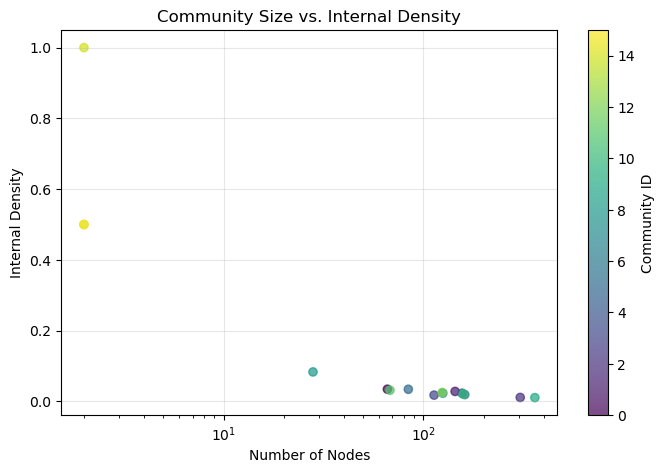

In [27]:
# --- Community Characterization ---
# Assuming 'node_community_mapping' is a dictionary mapping node_id to community_id
# Assuming 'G' is your directed graph
# Assuming 'centrality_df' exists and is indexed by node ID

# Check if the node_community_mapping exists (created in cell ad843400)
if 'node_community_mapping' in locals() and isinstance(node_community_mapping, dict):
    community_ids = set(node_community_mapping.values())
    print(f"\nCharacterizing {len(community_ids)} detected communities...")

    community_stats = []

    for comm_id in sorted(list(community_ids)):
        # Get nodes belonging to the current community ID using the mapping
        comm_nodes = [node for node, c_id in node_community_mapping.items() if c_id == comm_id]

        if not comm_nodes:
            print(f"Community {comm_id} is empty, skipping.")
            continue

        # Create subgraph for the community
        comm_subgraph = G.subgraph(comm_nodes)

        # Basic Stats
        num_nodes = comm_subgraph.number_of_nodes()
        num_edges = comm_subgraph.number_of_edges()
        # Calculate density only if there are nodes to avoid division by zero or errors
        density = nx.density(comm_subgraph) if num_nodes > 1 else 0

        # Average Internal Degrees (within the community subgraph)
        # Calculate only if there are nodes
        avg_in_degree = 0
        avg_out_degree = 0
        if num_nodes > 0:
             in_degrees_internal = dict(comm_subgraph.in_degree())
             out_degrees_internal = dict(comm_subgraph.out_degree())
             if in_degrees_internal:
                 avg_in_degree = np.mean(list(in_degrees_internal.values()))
             if out_degrees_internal:
                 avg_out_degree = np.mean(list(out_degrees_internal.values()))


        # Optional: Average Centrality within the community (using pre-calculated global values)
        avg_pagerank = 0
        avg_betweenness = 0
        avg_eigenvector = 0 # Added eigenvector
        if 'centrality_df' in locals():
             # Ensure comm_nodes are valid indices for centrality_df
             valid_comm_nodes = [node for node in comm_nodes if node in centrality_df.index]
             if valid_comm_nodes:
                 comm_centralities = centrality_df.loc[valid_comm_nodes]
                 if not comm_centralities.empty:
                     # Check if columns exist before calculating mean
                     if 'page_rank' in comm_centralities:
                         avg_pagerank = comm_centralities['page_rank'].mean()
                     if 'betweenness' in comm_centralities:
                         avg_betweenness = comm_centralities['betweenness'].mean()
                     if 'eigenvector' in comm_centralities:
                         avg_eigenvector = comm_centralities['eigenvector'].mean()


        stats = {
            'community_id': comm_id,
            'num_nodes': num_nodes,
            'num_edges': num_edges,
            'density': density,
            'avg_internal_in_degree': avg_in_degree,
            'avg_internal_out_degree': avg_out_degree,
            'avg_pagerank': avg_pagerank,
            'avg_betweenness': avg_betweenness,
            'avg_eigenvector': avg_eigenvector # Added eigenvector
        }
        community_stats.append(stats)

    # Create a DataFrame for easy comparison
    community_stats_df = pd.DataFrame(community_stats)
    # Check if DataFrame is not empty before setting index
    if not community_stats_df.empty:
        community_stats_df.set_index('community_id', inplace=True)

    print("\n--- Community Statistics Summary ---")
    # Display with controlled precision
    with pd.option_context('display.float_format', '{:,.4f}'.format):
        print(community_stats_df)

    # Optional: Visualize some stats (e.g., size vs. density)
    if not community_stats_df.empty and 'num_nodes' in community_stats_df and 'density' in community_stats_df:
        plt.figure(figsize=(8, 5))
        scatter = plt.scatter(community_stats_df['num_nodes'], community_stats_df['density'],
                    c=community_stats_df.index, cmap='viridis', alpha=0.7) # Color by community ID
        plt.xlabel('Number of Nodes')
        plt.ylabel('Internal Density')
        plt.title('Community Size vs. Internal Density')
        plt.xscale('log') # Often useful if sizes vary greatly
        plt.colorbar(scatter, label='Community ID')
        plt.grid(True, alpha=0.3)
        plt.show()
    else:
         print("\nSkipping size vs density plot due to missing data.")

else:
    print("\nCommunity partition dictionary 'node_community_mapping' not found or is not a dictionary.")
    print("Please ensure the 'Detect Network Communities' cell (ad843400) has been run successfully.")


## Analyze Temporal Activity of a Top User
Select the user with the highest in-degree. Filter the DataFrame for messages received by this user. Aggregate received messages per day and visualize the activity trend using a Plotly line chart.

In [22]:
# Select the top user based on weighted in-degree
top_user_id, top_user_degree_w = top_in_degree_weighted[0]
print(f"\nAnalyzing temporal activity for the top user by weighted in-degree: User {top_user_id} ({top_user_degree_w} messages received)")

# Filter DataFrame for messages received by this user
user_received_df = df[df['TGT'] == top_user_id].copy()

# Aggregate received messages per day
user_received_per_day = user_received_df.groupby('date').size().reset_index(name='count')

# Create interactive line chart for the top user's activity
fig_user_time = go.Figure()
fig_user_time.add_trace(go.Scatter(
    x=user_received_per_day['date'],
    y=user_received_per_day['count'],
    mode='lines+markers',
    name=f'Messages Received by User {top_user_id}'
))
fig_user_time.update_layout(
    title=f'Daily Messages Received by Top User ({top_user_id})',
    xaxis_title='Date',
    yaxis_title='Number of Messages Received',
    hovermode='x unified'
)
fig_user_time.show()


Analyzing temporal activity for the top user by weighted in-degree: User 1624 (558 messages received)


## Conclusion

This notebook analyzed the college message network dataset. We loaded the data, explored message trends over time, constructed a directed graph, and analyzed its structural properties like density, connectivity, and clustering. We identified key users using degree and centrality measures (PageRank, Eigenvector, Betweenness). Communities were detected using the Louvain algorithm, revealing subgroups within the network. Finally, interactive visualizations using Plotly allowed exploration of the full network, a subgraph of central users, and the temporal activity of the most popular user, with nodes colored by community and sized by importance.